<center><h1> EUROVISION SONG CONTEST </h1></center>

---

<center><h2> SQUAD AZUCAR MORENO </h2></center>

---

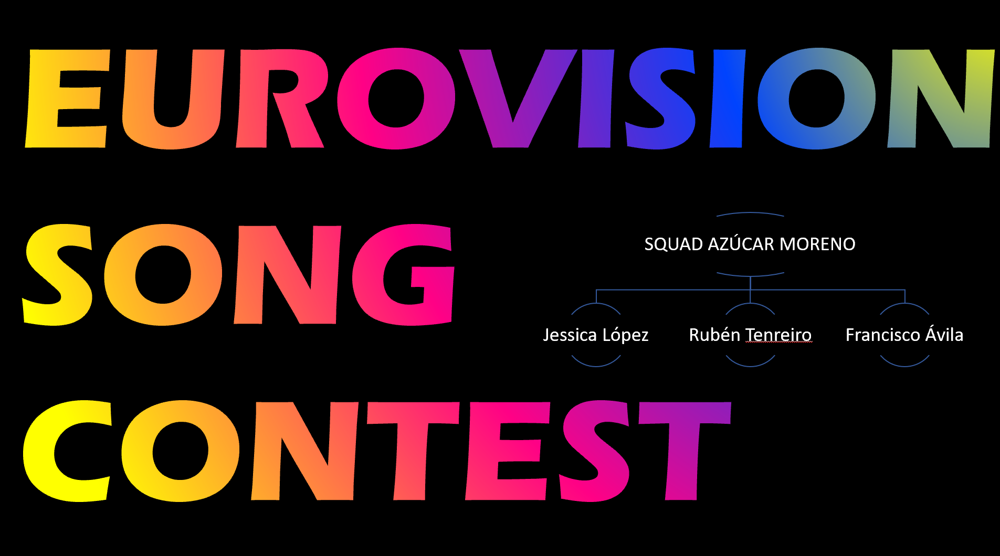

# Index

<ul>
    <li><b>1. <u>Introduction</u></b></li>
    <li><b>2. <u>ETL</u></b></li>
    <li><b>3. <u>Dashboard</u></b></li>
    <li><b>4. <u>Machine Learning</u></b></li>
    <li><b>5. <u>Conclusions</u></b></li>
    <li><b>6. <u>Bibliography</u></b></li>
</ul>

<center><h1> Eurovision as a Master's Thesis Topic </h1></center>

---

# Introduction

<p style="text-align: justify;">
Eurovision is an annual international song competition that has been held since 1956, where each participating country submits an original song and performs it live on television. It is one of the longest-running television programs in the world and has a massive global audience of over 180 million viewers. The competition provides an interesting and rich dataset for exploring a wide range of data science topics. In this master's thesis, we will explore the different modules of the master, including ETL, Python, SQL, Power BI, ML, and DL, and explain how they can be applied to Eurovision data.
</p>

## Project organization

<p style="text-align: justify;">
The project main file is this jupyter notebook. We have created several functions that were stored in different <code>.py</code> files that are going to be imported into this notebook. By doing so we hope to improve the readability of the notebook and focus on the decisions made when creating the database and machine learning models.
</p>
<p style="text-align: justify;">
All of the functions used in the project are documented with PEP 484 compliant docstrings, which ensures that they are well-documented and easily understandable for future users and maintainers. 
</p>
<p style="text-align: justify;">
The functions are then used for extracting, cleaning and preparing the data to be used in creating a SQL database, Power BI visualizations and machine and deep learning models.
</p>

# ETL

## Extraction - Wikipedia & Kaggle as our data sources

<p style="text-align: justify;">
    Our sources of information were mainly <a href="https://www.wikipedia.org/">Wikipedia</a> and <a href"https://www.kaggle.com/">Kaggle</a>. We also used <a href="https://musicstax.com/">Musicstax</a> to fill out some missing values in our data. The process can be summarized with the following image:
</p>

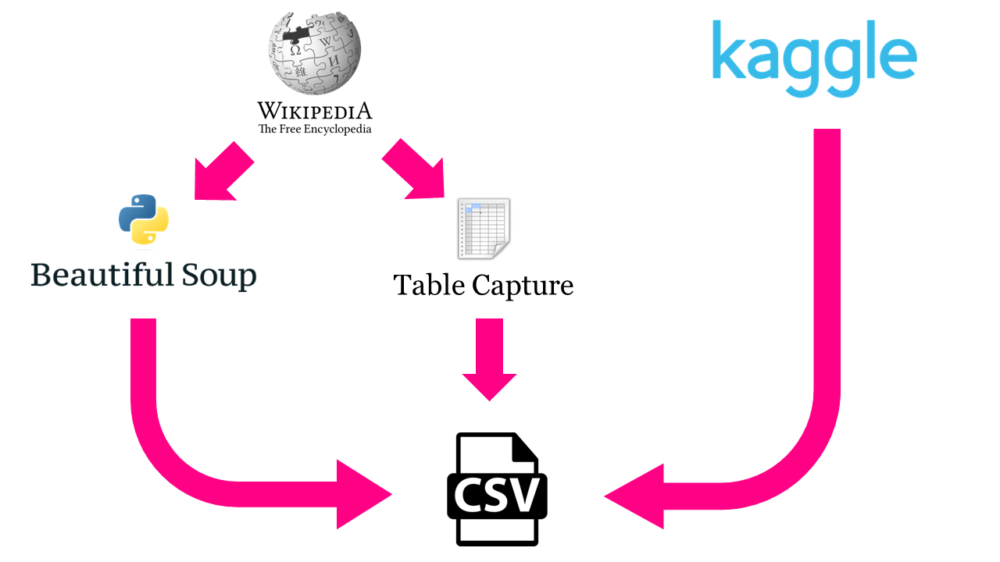

<p style="text-align: justify;">
To obtain the data from Wikipedia, we used different techniques:
</p>
<p style="text-align: justify;">
Beautiful Soup library in Python. <code>bs4</code> is a powerful tool for web scraping, which allows us to extract data from HTML.
</p>
<p style="text-align: justify;">
It is necessary to have created the folders: <code>puntos_por_anho</code> and <code>canciones_por_anho</code>.
</p>
<p style="text-align: justify;">
Table capture: we used this extension to obtain the tables from the years 2002,2003 and 2007, wich we saved in <code>.csv</code> format, because Beautil Soup didn't work correctly.
</p>
<p style="text-align: justify;">
Kaggle platform: we used a Kaggle dataset in our project, we downloaded it from the platform in   <code>.csv</code> and saved it to our local computer.
</p>
<p style="text-align: justify;">
The functions that we have created to obtain the data, are stored in the <code>wikipedia.py</code> file.
</p>
<p style="text-align: justify;">
The dataset had some missing values. We used the Musicxstax website to fill them out.
</p>
<p style="text-align: justify;">
We populated the year 2023 by following the structure of the previous dataframes.

In [1]:
import wikipedia

In [2]:
wikipedia.get_wikipedia_data()

Getting points per year from Wikipedia...
Tables puntos_por_anho created!
Getting songs per year from Wikipedia...
Tables anhos_y_canciones created!


## Cleaning 

<p style="text-align: justify;">
During the data cleaning process, we dropped several columns from our dataset. Here's an explanation of why we dropped each column:
<p>
<ul>
<li style="text-align: justify;">
<code>direct_qualifier_10, qualified_10, final_total_points</code>: These columns contain information that can be obtained by combining information from different 
columns that we already have. As a result, keeping these columns would create redundancy in the dataset.
</li>
<li style="text-align: justify;">
<code>selection, release_date, key_change_10, race, age</code>: These columns are constants and do not provide any useful information for our analysis. Therefore, we decided to drop them.
</li>
<li style="text-align: justify;">
<code>instrumentalness</code>: This column is mostly zeroes and does not provide much useful information for our analysis. Therefore, we decided to drop it.
</li>
<li style="text-align: justify;">
<code>final_jury_votes, final_televote_votes</code>: These columns contain information that is not relevant for our model, and can also be obtained from different columns. As a result, keeping these columns would create redundancy in the dataset.
</li>
<li style="text-align: justify;">
<code>semi_total_points</code>: This column contains information about the semifinals, but we are only interested in studying the final. Therefore, we decided to drop it.
</li>
</ul>
<p style="text-align: justify;">
During the data cleaning process, we encountered some issues with the <code>loudness</code> column in our dataset. We found missing values in this column, which we filled out using information from Musicxstax. However, we noticed that all the decibel values in Musicxstax were negative, whereas the information in our dataset had both positive and negative values.
<p>
<p style="text-align: justify;">
To solve this problem, we decided to change all the decibel values in our loudness column to negative ones. This allowed us to ensure that the measurements in our dataset were consistent with the measurements in Musicxstax, which we used to fill in the missing values.
<p>
<p style="text-align: justify;">
Changing the measurements to negative ones is a common practice in audio signal processing. This is because the decibel scale is logarithmic, which means that a change of 6 dB corresponds to a doubling or halving of the sound pressure level. By convention, negative decibel values are used to represent sound pressure levels that are below a reference level, while positive decibel values are used to represent sound pressure levels that are above the reference level.
<p>
<p style="text-align: justify;">
Therefore, changing the measurements to negative ones is a valid and appropriate solution for our data cleaning process.
<p>

In [3]:
import cleaning
import visualization

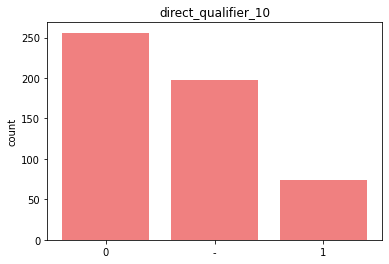

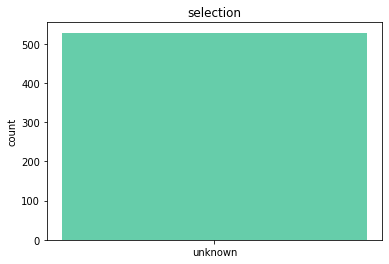

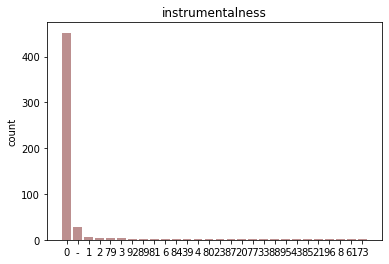

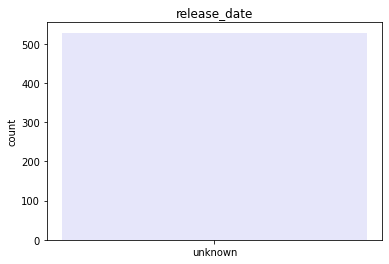

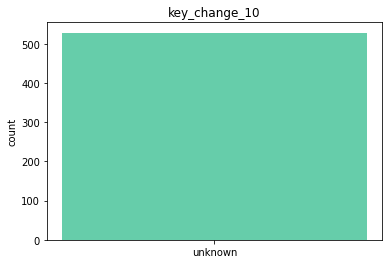

...

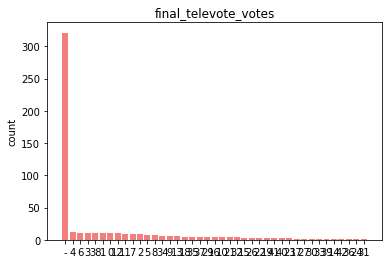

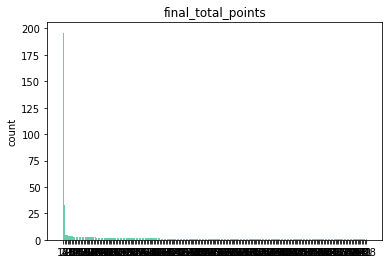

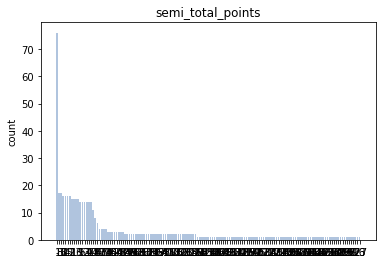

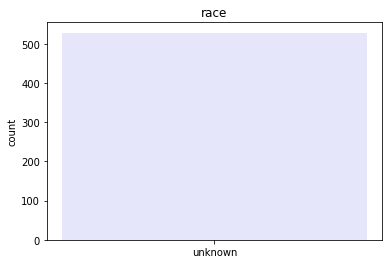

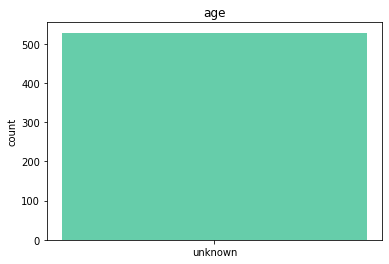

Data cleaned and stored in /cleaned_data


In [4]:
cleaning.clean_all_data()

<p style="text-align: justify;">
We now proceed to plot the remaining columns of the dataframe.
</p>

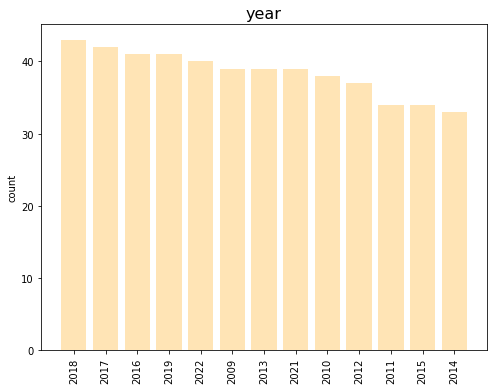

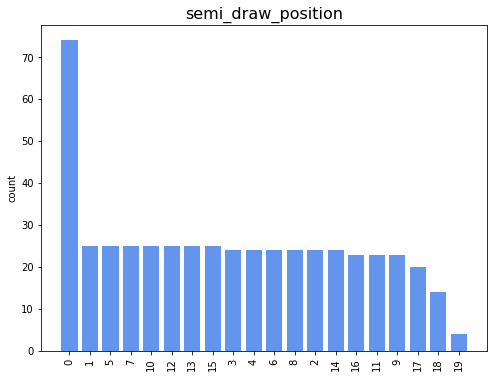

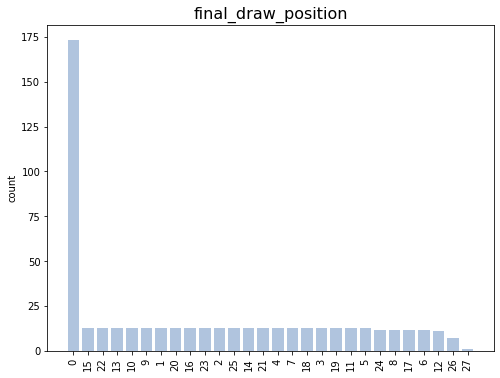

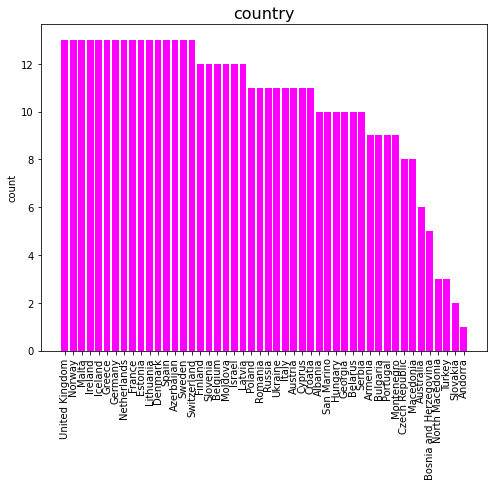

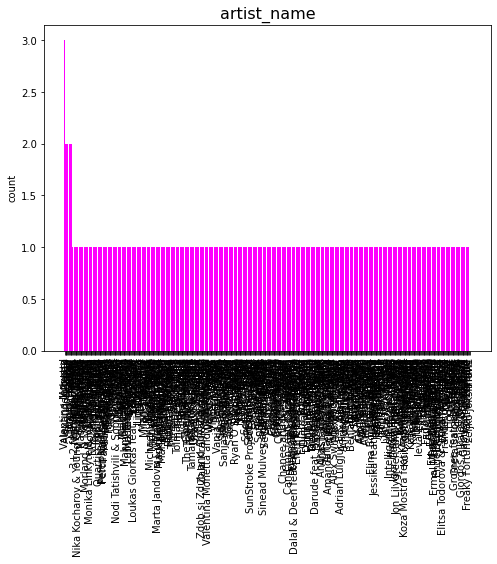

...

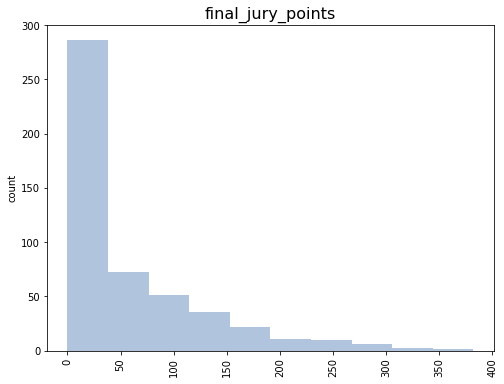

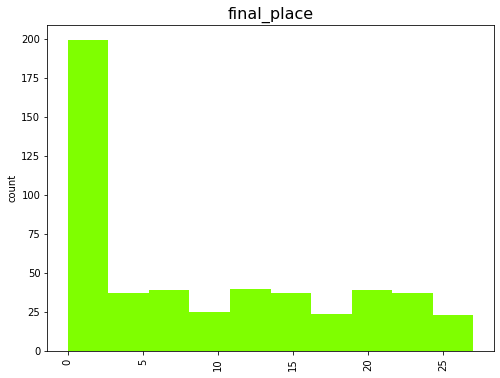

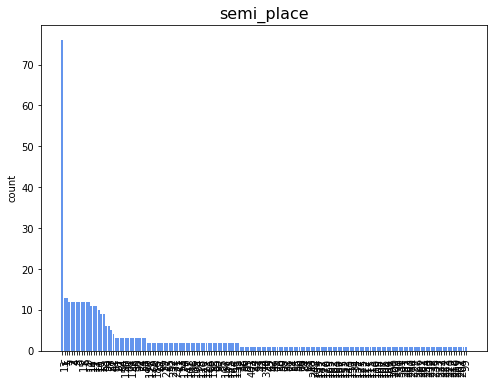

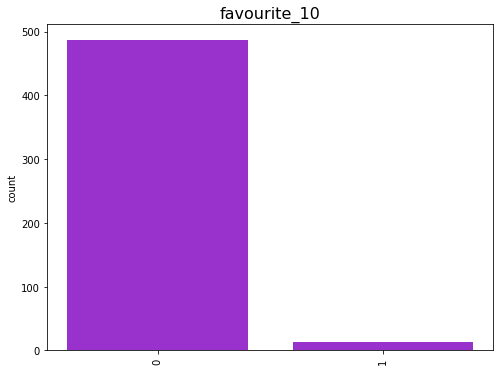

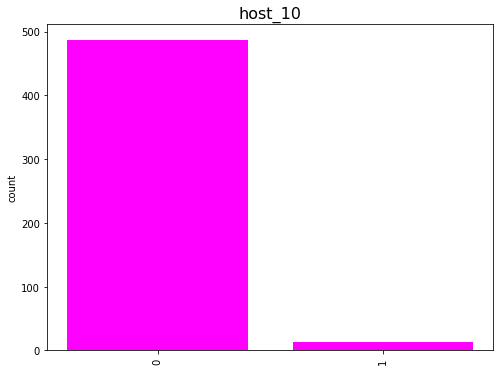

In [5]:
visualization.plot_data()

## Transforming

</li></ul>
<p style="text-align: justify;">In this stage, we are preparing the data for later upload into SQL. To accomplish this, we will need to perform the following transformations:</p>
<ul>
<li style="text-align: justify;">We merge the data frames.</li>
<li style="text-align: justify;">We clean the column names.</li>
<li style="text-align: justify;">We create an ID column to serve as the primary key in the SQL tables. The ID will be formed using the first five letters of the country name plus the year.</li>
<li style="text-align: justify;">We delete the following columns:</li>
<ul>
<li style="text-align: justify;"><code>semi_draw_position:</code> This column contains information about the semifinals, but we are only interested in studying the final. Therefore, we have decided to drop it.</li>
<li style="text-align: justify;"><code>semi_place:</code> This column contains information about the semifinals, but we are only interested in studying the final. Therefore, we have decided to drop it.</li>
<li style="text-align: justify;"><code>final_televote_points:</code> These columns contain information that is not relevant for our model, and can also be obtained from different columns. Keeping these columns would create redundancy in the dataset.</li>
<li style="text-align: justify;"><code>final_jury_points:</code> These columns contain information that is not relevant for our model, and can also be obtained from different columns. Keeping these columns would create redundancy in the dataset.</li>
<li style="text-align: justify;"><code>artist_name, song_name, language:</code> These columns contain information that is not relevant for our model.</li>
</ul>
<li style="text-align: justify;">We change the data types.</li>
<li style="text-align: justify;">We concatenate the dataframes.</li>
</ul>

In [6]:
import transforming

In [7]:
from transforming import canciones_overview, canciones_features, puntos_por_anho, canciones_2023, canciones_08, canciones

## Loading - MySQL

<p style="text-align: justify;">
We chose MySQL, a relational database, as the storage solution for our data.As a relational database, it organizes data into tables with relationships between them. This makes it easier for us to manage and manipulate the data in a structured way. By having all our data is stored in one place, it was easily accessible and centralized at all times, making it easier for us to work collaboratively.
</p>
<p style="text-align: justify;">
We wanted to build dashboards in Power BI, and the easiest option was to connect Power BI directly to MySQL. This allows us to create visualizations and reports based on our data in real-time.
</p>
<p style="text-align: justify;">
We used Python and the SQLAlchemy library to populate the tables in our MySQL database. SQLAlchemy is an Object-Relational Mapping (ORM) library that makes it easy to interact with relational databases using Python. It abstracts away some of the complexities of SQL and allows us to work with the database in a more Pythonic way. The combination of Pandas and SQLAlchemy provides a powerful toolkit for working with data, allowing users to easily load data from SQL databases, manipulate it using Pandas, and write it back to the database using SQLAlchemy.
</p>
<p style="text-align: justify;">
After we had the data stored in our MySQL database, we created views to load the information in Power BI. Views are virtual tables that are based on the result of an SQL query. They allow us to easily combine data from multiple tables and create a unified view of the data that can be easily consumed by tools like Power BI.
</p>
<p style="text-align: justify;">
All the functions we've used were stored in the <code>sql_lib.py</code> file and were imported into this notebook. 
</p>
<p style="text-align: justify;">
Please find below the Entity-Relationship (EER) diagram of our database:
</p>

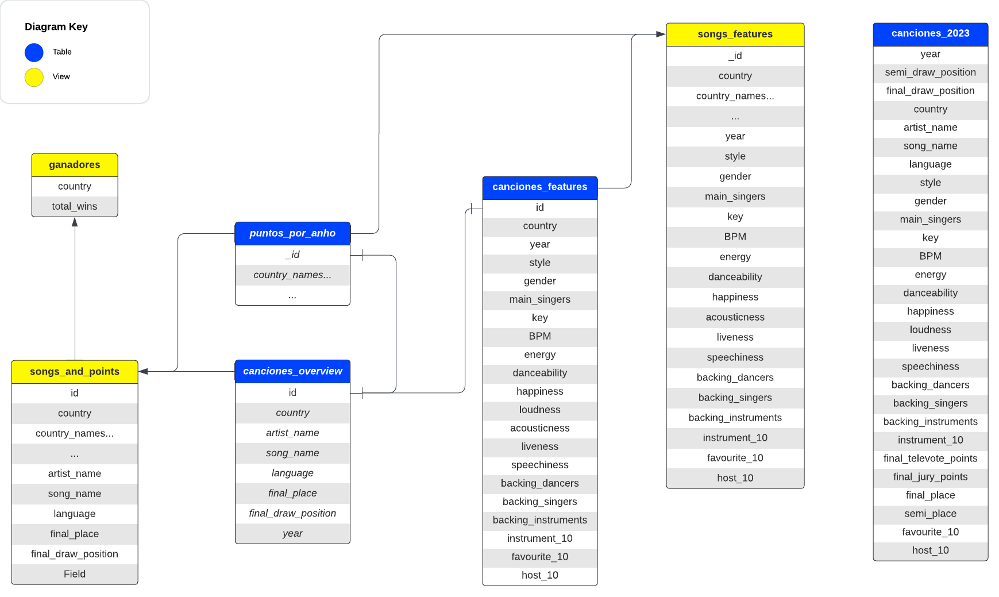

In [8]:
import sql_lib

In [9]:
sql_lib.pd_df_to_sql_tables(canciones_overview, 'canciones_overview')
sql_lib.pd_df_to_sql_tables(canciones_features, 'canciones_features')
sql_lib.pd_df_to_sql_tables(puntos_por_anho, 'puntos_por_anho')
sql_lib.pd_df_to_sql_tables(canciones_2023, 'canciones_2023')

Table canciones_overview created with 1349 rows.
Table canciones_features created with 327 rows.
Table puntos_por_anho created with 1359 rows.
Table canciones_2023 created with 37 rows.


In [10]:
sql_lib.create_view("""
     CREATE or REPLACE VIEW songs_and_points AS 
     SELECT *
     FROM puntos_por_anho
     LEFT JOIN canciones_overview ON 
     puntos_por_anho._id = canciones_overview.id
 """)

View has been created!


In [11]:
sql_lib.create_view("""
     CREATE or REPLACE VIEW songs_features AS
     SELECT * FROM puntos_por_anho
     LEFT JOIN canciones_features ON
     puntos_por_anho._id = canciones_features.id
     WHERE year > 2008
 """)

View has been created!


In [12]:
sql_lib.create_view("""
     CREATE or REPLACE VIEW ganadores AS 
     SELECT country, COUNT(*) as total_wins
     FROM songs_and_points
     WHERE final_place = 1
     GROUP BY country
     ORDER BY total_wins desc
 """)

View has been created!


# Dashboard - PowerBI

<p style="text-align: justify;">We have connected MySQL to PowerBi. Thanks to this, once the database is updated, the dashboards will also update.</p>

<p style="text-align: justify;">The first canvas shows which countries voted for a particular country in a given year.</p>

<p style="text-align: justify;">The second canvas presents an analysis by year. By selecting a year, we can see a graph of the distribution of votes, the winner, and the languages spoken that year.</p>

<p style="text-align: justify;">The third canvas displays an analysis by country. We can see a history of the points obtained by that country, along with a zoom of the last 5 years that have the same voting system and a more similar style. We can also see the artists who won representing their country, the song they participated with, and the year. Additionally, we can see the languages in which that country has sung.</p>

<p style="text-align: justify;">The fourth and fifth canvases provide an analysis of the characteristics of the songs from 2009 to 2022. We can see the top 3 genres and styles in this top. We can also see a count of which countries have won throughout history and a box plot of the advanced characteristics of the winners.</p>

# Machine Learning

In [13]:
import preprocessing
import pandas as pd

## Preprocessing 
<p style="text-align: justify;">
We query the database to get the raw_data for our ML model. This model will predict which songs will be in the top 5 of the 2023 Eurovision final.</p>

In [14]:
from preprocessing import training_raw 

In [15]:
training_raw.head()

,BPM,acousticness,artist_name,backing_dancers,backing_instruments,backing_singers,country,danceability,energy,favourite_10,...,instrument_10,key,language,liveness,loudness,main_singers,song_name,speechiness,style,year
0,93,9,Monika Liu,0,0,0,Lithuania,68,56,0,...,0,c major,Lithuanian,31,-8,1,Sentimentai,3,Ballad,2022
1,116,87,Marius Bear,0,0,0,Switzerland,42,18,0,...,0,f major,English,11,-11,1,Boys Do Cry,4,Ballad,2022
2,105,14,Kalush Orchestra,1,2,2,Ukraine,83,82,1,...,0,d major,Ukrainian,12,-5,1,Stefania,4,Traditional,2022
3,87,39,S10,0,0,0,Netherlands,32,48,0,...,0,d minor,Dutch,14,-6,1,De diepte,3,Ballad,2022
4,142,41,Zdob si Zdub and Advahov Brothers,0,5,0,Moldova,70,88,0,...,0,c major,"English, Romanian",32,-3,1,Trenuletul,14,Traditional,2022


<p style="text-align: justify;">
Since this dataframe comes from the join of two tables in our database, we have some columns that we don't need. We dropped these non relevant columns. The columns that we dropped include "artist_name", "country", "final_draw_position", "song_name", "year", and "id".
<p>
<ul>
<li style="text-align: justify;">
<code>artist_name, country</code>: These columns columns did not provide any useful information for our analysis. 
</li>
<li style="text-align: justify;">
<code>song_name, year</code>: columns were not relevant as our analysis was focused on the characteristics of the songs rather than their names or the year they were released.
</li>
<li style="text-align: justify;">
<code>id</code>: This column was also dropped as it was only used as a unique identifier for each record in the dataset and did not provide any meaningful information for our analysis.
</li>
<li style="text-align: justify;">
<code>final_draw_position</code>: As the information for this column was not available at the time of our analysis for the finals of 2023.
</li>
</ul>
<p style="text-align: justify;">
By dropping these columns, we were able to focus on the relevant characteristics of the songs and create a more streamlined dataset for our analysis.
</p>
<p style="text-align: justify;">
We also created the target variable to estimate which countries will be in the top 5. This variable is a boolean where 1 represents countries that finished in the top 5 and 0 represents countries that didn't. 
</p>
<p style="text-align: justify;">
We removed "final_place" because we no longer needed it after creating this new <code>target_10</code> column.
</p>

In [16]:
# Drop columns mentioned above
to_drop = ["artist_name", "country", "final_draw_position", "song_name", "year", "id", "acousticness"]
training_raw.drop(to_drop, axis = 1, inplace = True)

# Create target variable
training_raw["target_10"] = preprocessing.create_target_variable(training_raw)
training_raw.drop('final_place', axis = 1, inplace = True)
training_raw.dtypes

BPM                     int64
backing_dancers         int64
backing_instruments     int64
backing_singers         int64
danceability            int64
energy                  int64
favourite_10            int64
gender                 object
happiness               int64
host_10                 int64
instrument_10           int64
key                    object
language               object
liveness                int64
loudness                int64
main_singers            int64
speechiness             int64
style                  object
target_10               int32
dtype: object

<p style="text-align: justify;">
We are going to plot non-numeric variables to determine how to handle them.
</p>


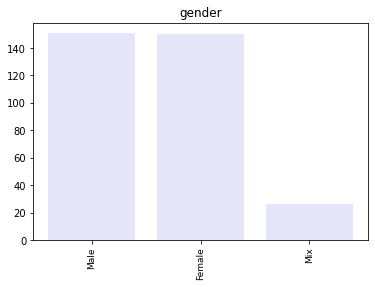

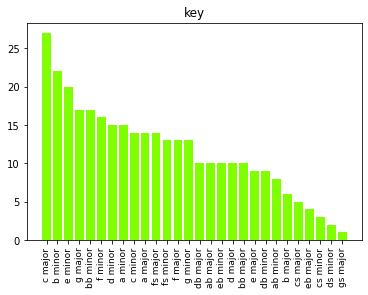

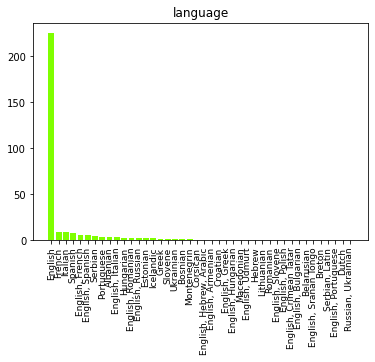

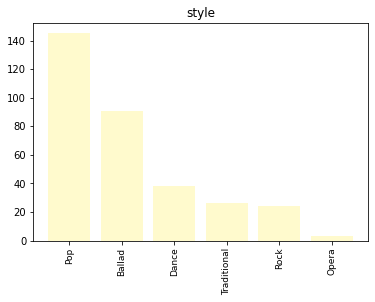

In [17]:
# Plot non numerical columns
visualization.plot_cats(training_raw, [col for col in training_raw.columns if training_raw[col].dtype == "object"])

### Transforming columns to categorical

<p style="text-align: justify;">
Considering these results, we will make the following changes to all the categorical columns:
<ul>
<li>
<code>gender</code> &rightarrow; OneHotEncoding 
<li>
<code>key</code> &rightarrow; LabelEncoding
</li>
<li style="text-align: justify;">
<code>language</code> &rightarrow; Group English-Non English because the original distribution was very imbalanced. Then we applied the OneHotEncoding 
</li>
<li>
<code>style</code> &rightarrow; OneHotEncoding
</li>
</ul>
</p>

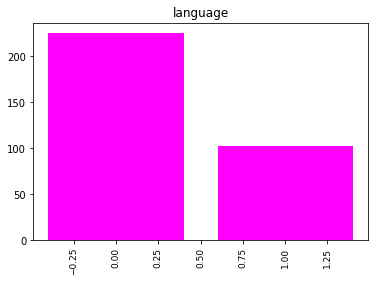

In [18]:
# Group language based on English-Non English songs
training_raw["language"] = training_raw["language"].apply(lambda x:0 if x == "English" else 1)
visualization.plot_cats(training_raw, ['language'])

In [19]:
# Convert object columns to categorical
for col in ["style", "gender"]:
    training_raw[col] = training_raw[col].astype("category")
training_raw.dtypes

BPM                       int64
backing_dancers           int64
backing_instruments       int64
backing_singers           int64
danceability              int64
energy                    int64
favourite_10              int64
gender                 category
happiness                 int64
host_10                   int64
instrument_10             int64
key                      object
language                  int64
liveness                  int64
loudness                  int64
main_singers              int64
speechiness               int64
style                  category
target_10                 int32
dtype: object

### OneHotEncoding

In [20]:
# We create a copy of the dataset
training_encoded = training_raw.copy()

# Define columns in which we'll perform one hot encoding
onehot_cols = ["style", "gender"]

# One hot encoding
onehot = preprocessing.OneHotEncoder(drop = "first")
onehot_cols_encoded = pd.DataFrame(onehot.fit_transform(training_raw[onehot_cols]).toarray())
onehot_cols_encoded.columns = onehot.get_feature_names_out()
training_encoded.drop(onehot_cols, axis = 1, inplace = True)
training_encoded = pd.concat([training_encoded, onehot_cols_encoded], axis = 1)
training_encoded.head(5)

,BPM,backing_dancers,backing_instruments,backing_singers,danceability,energy,favourite_10,happiness,host_10,instrument_10,...,main_singers,speechiness,target_10,style_Dance,style_Opera,style_Pop,style_Rock,style_Traditional,gender_Male,gender_Mix
0,93,0,0,0,68,56,0,50,0,0,...,1,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,116,0,0,0,42,18,0,39,0,0,...,1,4,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,105,1,2,2,83,82,1,32,0,0,...,1,4,1,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,87,0,0,0,32,48,0,15,0,0,...,1,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,142,0,5,0,70,88,0,96,0,0,...,1,14,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0


### LabelEncoding
<p style="text-align: justify;">
We are gonna label encode the column <code>key</code>. To do so, we are gonna use the  wave values in Hz of the different music keys.
</p>
<p style="text-align: justify;">
It is normal for some notes to have the same frequency, especially when we are talking about notes that are written differently but sound the same. This is because Western music uses a scale of 12 different notes per octave (twelfth parts of the fundamental frequency), and some of these notes have frequencies that are the same or very close to each other.
</p>
<p style="text-align: justify;">
    For example, in this dictionary we can see that both <i>cs major</i> and <i>db major</i> have the same frequency of 554.37 Hz, which means that both notes sound the same. This is because in Western music, these two notes are written differently but sound the same in a standard tuning.
</p>
<p style="text-align: justify;">
It is important to note that there are alternative tunings that can result in subtle differences in the frequencies of notes, but in general, notes with the same frequency are considered equivalent in Western music.
</p>
<p style="text-align: justify;">
Some of the sources used were:

> <a href="http://hyperphysics.phy-astr.gsu.edu/hbase/Sound/sound.html">hyperphysics</a> <br>

> <a href="https://newt.phys.unsw.edu.au/music/">UNSW University of Sidney</a>
</p>

In [21]:
# Dictionarie with key and its frequency in Hz
frequencies = {
    'a minor': 220.00,
    'a major' : 440.0,
    'ab major': 415.30,
    'ab minor': 207.65,
    'b major': 493.88,
    'b minor': 246.94,
    'bb major': 466.16,
    'bb minor': 233.08,
    'c major': 261.63,
    'c minor': 130.81,
    'cs major': 554.37,
    'cs minor': 277.18,
    'd major': 293.66,
    'd minor': 146.83,
    'db major': 554.37,
    'db minor': 277.18,
    'ds minor': 311.13,
    'e major': 329.63,
    'e minor': 164.81,
    'eb major': 622.25,
    'eb minor': 311.13,
    'f major': 349.23,
    'f minor': 174.61,
    'fs major': 739.99,
    'fs minor': 369.99,
    'g major': 392.00,
    'g minor': 196.00,
    'gs major': 415.30,
    'gs minor': 415.65
}

# Replace values in the `key` column with their frequencies in Hz
training_encoded['key'] = training_encoded['key'].replace(frequencies)

training_encoded.dtypes

BPM                      int64
backing_dancers          int64
backing_instruments      int64
backing_singers          int64
danceability             int64
energy                   int64
favourite_10             int64
happiness                int64
host_10                  int64
instrument_10            int64
key                    float64
language                 int64
liveness                 int64
loudness                 int64
main_singers             int64
speechiness              int64
target_10                int32
style_Dance            float64
style_Opera            float64
style_Pop              float64
style_Rock             float64
style_Traditional      float64
gender_Male            float64
gender_Mix             float64
dtype: object

### Prediction dataset - 2023

<p>We applied the same changes to this dataframe as we did to the previous one.</p>

In [22]:
from preprocessing import prediction_raw

In [23]:
# We select only the columns in the prediction dataset that exist in the training dataset
prediction_raw = prediction_raw[[i for i in prediction_raw.columns if i in list(training_raw.columns)]]
prediction_raw.head(5)

,BPM,backing_dancers,backing_instruments,backing_singers,danceability,energy,favourite_10,gender,happiness,host_10,instrument_10,key,language,liveness,loudness,main_singers,speechiness,style
0,126,4,0,0,56,91,0,Female,17,0,0,E Minor,English,33,-4,1,9,Pop
1,103,0,3,0,70,78,0,Male,82,0,0,F Minor,English,18,-6,1,4,Dance
2,103,4,0,0,55,73,0,Male,12,0,0,A Major,"Serbian, English",44,-8,1,6,Pop
3,160,0,4,0,56,55,0,Male,40,0,0,A Minor,English,8,-8,1,7,Rock
4,145,4,0,0,66,63,0,Female,77,0,0,Fs Minor,Portuguese,16,-8,1,5,Traditional


In [24]:
# Group language in the prediction dataset
prediction_raw["language"] = prediction_raw["language"].apply(lambda x:0 if x == "English" else 1)

In [25]:
# Transform object columns to categorical
for col in ["style", "gender"]:
    prediction_raw[col] = prediction_raw[col].astype("category")
prediction_raw.dtypes

BPM                       int64
backing_dancers           int64
backing_instruments       int64
backing_singers           int64
danceability              int64
energy                    int64
favourite_10              int64
gender                 category
happiness                 int64
host_10                   int64
instrument_10             int64
key                      object
language                  int64
liveness                  int64
loudness                  int64
main_singers              int64
speechiness               int64
style                  category
dtype: object

<p>Now we apply OneHotEncoding to the prediction dataset.</p>

In [26]:
# Apply one hot encoding to the same columns that we did in the training dataset
prediction_encoded = prediction_raw.copy()
onehot_cols = ["style", "gender"]
onehot = preprocessing.OneHotEncoder(drop = "first")
onehot_cols_encoded_pred = pd.DataFrame(onehot.fit_transform(prediction_raw[onehot_cols]).toarray())
onehot_cols_encoded_pred.columns = onehot.get_feature_names_out()
prediction_encoded.drop(onehot_cols, axis = 1, inplace = True)
prediction_encoded = pd.concat([prediction_encoded, onehot_cols_encoded_pred], axis = 1)

In [27]:
# Replace key with their frequencies in Hz
prediction_encoded['key'] = prediction_encoded['key'].apply(lambda x: x.lower())
prediction_encoded['key'] = prediction_encoded['key'].replace(frequencies)

In [28]:
# Identify the missing columns
missing_cols = [i for i in training_encoded.columns if i not in prediction_encoded.columns]
missing_cols

['target_10', 'style_Opera']

In [29]:
# Add the missing columns to predict dataset
prediction_encoded["style_Opera"] = [0 for i in range(len(prediction_encoded))]

### EDA

<p style="text-align: justify;">
We used <code>ydata-profiling</code> to perform the Exploratory Data Analysis (EDA) of our dataset. Pandas Profiling is a Python library that generates a comprehensive report on the dataset, including the distribution of values, missing values, correlation between variables, and other useful information. 
</p>

In [30]:
# Pandas profiling to create the report
report = preprocessing.ProfileReport(training_encoded)
report.to_file("report.html")
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Estas son la columnas con alta correlacion:
> Danceability - Happiness: 0,59 <br> 
> Backing Instruments - Rock : 0,547 <br>
> Energy - Happiness: 0,54 <br>
> Energy - Loudness: 0,660 <br>
> Energy- Speechiness: 0,511 <br>
> Main singer  - Gender Mix: 0,738

### Balancing the target variable

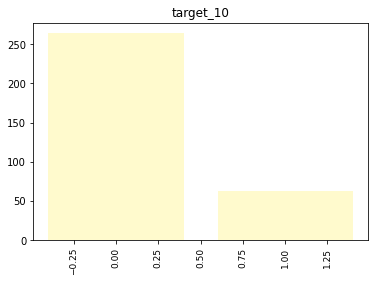

In [31]:
# X y split of the dataset and drop highly correlated columns
X = training_encoded.drop('target_10', axis=1)
X.drop(["danceability","energy", "gender_Mix"], axis = 1, inplace = True)
y= training_encoded['target_10']
prediction_encoded = prediction_encoded.loc[:, list(X.columns)]
visualization.plot_cats(training_encoded, ["target_10"])

<p style="text-align: justify;">
As we have observed a significant class imbalance in the target variable, we will be employing data augmentation techniques. We will conduct two tests, one using SMOTE and the other using RandomOverSampling.
</p>
<p style="text-align: justify;">
<b>SMOTE</b> (Synthetic Minority Over-sampling Technique) is a data augmentation technique used to address class imbalance. It works by creating synthetic samples of the minority class by interpolating between the minority class samples. In other words, it generates new data points by taking the difference between two minority class samples and multiplying it by a random number between 0 and 1. This helps to balance the number of samples in each class, making the dataset more representative and reducing the risk of biased models.
</p>
<p style="text-align: justify;">
<b>Random oversampling</b>, on the other hand, is a simple technique that involves randomly duplicating samples from the minority class to match the number of samples in the majority class. This method can lead to overfitting, as the model may learn to memorize the duplicated samples. However, it can be useful when the dataset is too small or when other augmentation techniques like SMOTE are not applicable.
</p>

In [32]:
#SMOTE
smote = preprocessing.SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)

# Check whether the target variable is now balanced or not
print(y_smote.value_counts())

0    264
1    264
Name: target_10, dtype: int64


In [33]:
#RANDOM OVERSAMPLING

# Randomly choose rows from the minority class
minority_samples = X[y == 1]
n_samples = X[y == 0].shape[0]

minority_upsampled = preprocessing.resample(minority_samples, 
                  replace=True, 
                  n_samples=n_samples, 
                  random_state=42)

# Merge the rows we've just created with the majority class
X_upsampled = pd.concat([X[y == 0], minority_upsampled])
y_upsampled = pd.concat([y[y == 0],pd.Series([1] * n_samples)])

# Check whether the target variable is now balanced or not
print(y_upsampled.value_counts())

0    264
1    264
dtype: int64


### Standardization
<p style="text-align: justify;">
We split the dataset into training and testing sets to evaluate the model's performance on new data. Additionally, we use Standard Scaler to ensure that features are on the same scale and to improve model performance by preventing any particular feature from dominating the others.
</p>
<p style="text-align: justify;">
Since we want to study which method delivers the best results for our case, we're gonna standardize the dataset balanced using SMOTE and the dataset balanced using Random Oversampling separately, and we are going to train and test different models with both of them.
</p>

#### SMOTE training and test data

In [34]:
# Train and test split 85-15 ratio
X_smote_train, X_smote_test, y_smote_train, y_smote_test = preprocessing.train_test_split(X_smote, y_smote, test_size=0.15, random_state=66)

# Apply standard scaler
scaler = preprocessing.StandardScaler()
X_scaled_smote_train = scaler.fit_transform(X_smote_train)
X_scaled_smote_test = scaler.transform(X_smote_test)

#### Random oversampling training and test data

In [35]:
# Train and test split 85-15 ratio
X_upsampled_train, X_upsampled_test, y_upsampled_train, y_upsampled_test = preprocessing.train_test_split(X_upsampled, y_upsampled, test_size=0.15, random_state=66)

# Apply standard scaler
scaler = preprocessing.StandardScaler()
X_scaled_os_train = scaler.fit_transform(X_upsampled_train)
X_scaled_os_test = scaler.transform(X_upsampled_test)

#### Prediction dataset - 2023

In [36]:
# Apply standard scaler
scaler = preprocessing.StandardScaler()
scaled_23 = scaler.fit_transform(prediction_encoded)

## Models

<p style="text-align: justify;">
In order to predict which countries will be in the top 5 of this year's Eurovision contest based on song data from 2009, we have selected three different machine learning models to evaluate their performance.
</p>
<p style="text-align: justify;">
<b>Logistic Regression</b>: <br>
We chose logistic regression because it is a widely-used and effective classification algorithm that can be used to predict binary outcomes. Since our target variable is a binary indicator for whether a country is in the top 5 or not, logistic regression is a natural choice. It also has the advantage of being a simple and interpretable model, making it easier to understand the relationship between the features and the target variable.
</p>
<p style="text-align: justify;">
<b>Random Forest</b>: <br>
Random forest is an ensemble learning algorithm that combines multiple decision trees to create a more accurate and robust model. It is a good choice for our problem because it can handle non-linear relationships between the features and the target variable, and can also handle high-dimensional data. Random forest also has the advantage of being less prone to overfitting than a single decision tree, which can be useful when working with a limited dataset.
</p>
<p style="text-align: justify;">
<b>Neural Network</b>: <br>
Neural networks are a powerful class of machine learning algorithms that can be used for a wide range of classification and regression problems. We chose to use a neural network because it has the potential to capture complex and non-linear relationships between the features and the target variable, which may be important for accurately predicting the top 5 countries. Neural networks can also handle high-dimensional data and can be trained using a variety of optimization algorithms. However, neural networks are typically more complex than other models, and can be more difficult to interpret.
</p>

### SMOTE Dataset

#### Logistic Regression

Accuracy: 0.712500
Precision: 0.717391
Recall: 0.767442
F1 score: 0.741573


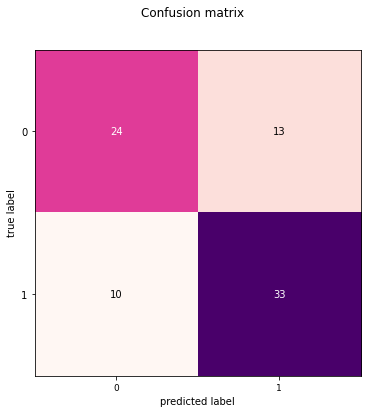

In [37]:
# Instance of the model, train and check results
logisticRegr_smote = preprocessing.LogisticRegression(max_iter=10000)
logisticRegr_smote.fit(X_scaled_smote_train, y_smote_train)
preprocessing.statistics(logisticRegr_smote, X_scaled_smote_test, y_smote_test)

In [38]:
# Get predictions array
preprocessing.top_2023(logisticRegr_smote, scaled_23)

Model predicts 15 countries will make it in the top five


,country,0
0,Norway,1
1,Malta,1
8,Israel,1
10,Sweden,1
13,Netherlands,1
19,Belgium,1
20,Cyprus,1
21,Iceland,1
23,Poland,1
25,Georgia,1


In [39]:
# Create paises to associate predictions with specific countries
paises = sql_lib.sql("""SELECT country FROM canciones_2023""")

# Get preditions
y_pred_prob_log_smote = logisticRegr_smote.predict_proba(scaled_23)
y_pred_log_smote = (y_pred_prob_log_smote[:,1] >= 0.78).astype(int)
lr_smote_prob_log_smote = pd.concat([paises,pd.DataFrame(y_pred_log_smote)], axis = 1)
lr_smote_prob_log_smote[lr_smote_prob_log_smote[0]== 1]

,country,0
8,Israel,1
10,Sweden,1
19,Belgium,1
20,Cyprus,1
21,Iceland,1


#### RandomForest

Accuracy: 0.925000
Precision: 1.000000
Recall: 0.860465
F1 score: 0.925000


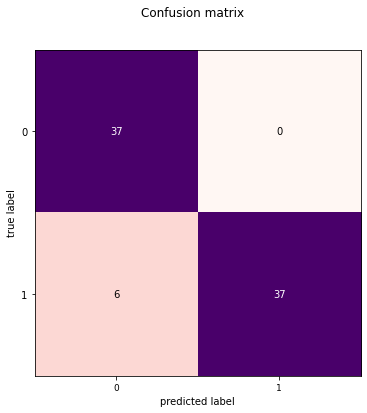

In [40]:
# Instance of the model, train and check results
rf_smote = preprocessing.RandomForestClassifier(n_estimators = 10000, random_state=42)
rf_smote.fit(X_smote_train, y_smote_train)
preprocessing.statistics(rf_smote,X_smote_test, y_smote_test)

In [41]:
# Get predictions array
preprocessing.top_2023(rf_smote, scaled_23)

Model predicts 16 countries will make it in the top five


,country,0
1,Malta,1
2,Serbia,1
7,Switzerland,1
9,Moldova,1
10,Sweden,1
13,Netherlands,1
14,Finland,1
15,Denmark,1
19,Belgium,1
20,Cyprus,1


In [42]:
# Get predictions
y_pred_prob = rf_smote.predict_proba(scaled_23)
y_pred = (y_pred_prob[:,1] >= 0.6).astype(int)
paises= sql_lib.sql("""SELECT country FROM canciones_2023""")
rf_smote_prob = pd.concat([paises,pd.DataFrame(y_pred)], axis = 1)
rf_smote_prob[rf_smote_prob[0]== 1]

,country,0
1,Malta,1
15,Denmark,1
19,Belgium,1
20,Cyprus,1


#### Neural Network
<p style="text-align: justify;">
The Sigmoid function is commonly used for binary classification tasks as it maps the output to a probability value between 0 and 1. In this case, the sigmoid function will output a probability value that can be interpreted as the likelihood of a country ending up in the top 5, given the input features.
</p>
<p style="text-align: justify;">
The binary cross-entropy loss function is commonly used for binary classification problems. This function is used to calculate the difference between the predicted probabilities and the actual binary labels.
</p> 
<p style="text-align: justify;">
For the optimizer, Adam is a popular choice as it's a variant of stochastic gradient descent (SGD) that dynamically adapts the learning rate based on the gradient values.    
</p>

In [43]:
# Instance of the model
model_nn_smote = preprocessing.tf.keras.Sequential([
    preprocessing.tf.keras.layers.Dense(32,  
        input_shape=(X_scaled_smote_train.shape[1],)),
    preprocessing.tf.keras.layers.Dense(32, 
        activation='relu', kernel_regularizer=preprocessing.regularizers.l2(0.001)),
    preprocessing.tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model_nn_smote.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
model_nn_smote.fit(X_scaled_smote_train, y_smote_train, 
          validation_data = (X_scaled_smote_test, y_smote_test),
          epochs=55, batch_size=64)

Epoch 1/55
7/7 [==============================] - 1s 32ms/step - loss: 0.7491 - accuracy: 0.5134 - val_loss: 0.7336 - val_accuracy: 0.5500
Epoch 2/55
7/7 [==============================] - 0s 5ms/step - loss: 0.7075 - accuracy: 0.5692 - val_loss: 0.7156 - val_accuracy: 0.5375
Epoch 3/55
7/7 [==============================] - 0s 4ms/step - loss: 0.6743 - accuracy: 0.6228 - val_loss: 0.7006 - val_accuracy: 0.5375
Epoch 4/55
7/7 [==============================] - 0s 5ms/step - loss: 0.6477 - accuracy: 0.6786 - val_loss: 0.6892 - val_accuracy: 0.5625
Epoch 5/55
7/7 [==============================] - 0s 4ms/step - loss: 0.6277 - accuracy: 0.7210 - val_loss: 0.6790 - val_accuracy: 0.5750
Epoch 6/55
7/7 [==============================] - 0s 4ms/step - loss: 0.6101 - accuracy: 0.7545 - val_loss: 0.6720 - val_accuracy: 0.5875
Epoch 7/55
7/7 [==============================] - 0s 5ms/step - loss: 0.5952 - accuracy: 0.7522 - val_loss: 0.6658 - val_accuracy: 0.5875
Epoch 8/55
7/7 [=================

3/3 [==============================] - 0s 1ms/step


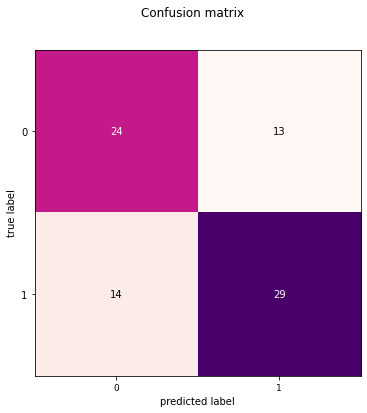

Accuracy: 0.662500
Precision: 0.690476
Recall: 0.674419
F1 score: 0.682353


In [44]:
# Check results
preprocessing.nn_statistics(model_nn_smote, X_scaled_smote_test, y_smote_test)

In [45]:
# Get predictions
pred_2023_nn_smote = model_nn_smote.predict(scaled_23).flatten()
top_nn_smote = pd.concat([paises, pd.DataFrame(pred_2023_nn_smote)], axis=1)
top_nn_smote.sort_values(by=[0], ascending = False).head(5)

2/2 [==============================] - 0s 998us/step


,country,0
10,Sweden,0.975051
1,Malta,0.902431
19,Belgium,0.894102
20,Cyprus,0.874564
28,Albania,0.870899


### Random OverSampling Dataset
#### Logistic Regression

Accuracy: 0.650000
Precision: 0.702703
Recall: 0.604651
F1 score: 0.650000


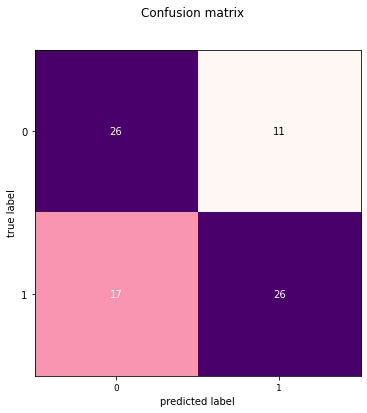

In [46]:
# Instance of the model, train and check results
logisticRegr_os = preprocessing.LogisticRegression(max_iter=10000)
logisticRegr_os.fit(X_scaled_os_train, y_upsampled_train)
preprocessing.statistics(logisticRegr_os, X_scaled_os_test, y_upsampled_test)

In [47]:
# Get predictions array
preprocessing.top_2023(logisticRegr_os, scaled_23)

Model predicts 15 countries will make it in the top five


,country,0
0,Norway,1
1,Malta,1
2,Serbia,1
5,Ireland,1
8,Israel,1
10,Sweden,1
11,Azerbaijan,1
13,Netherlands,1
16,Armenia,1
17,Romania,1


In [48]:
# Get predictions
y_pred_prob_log_os = logisticRegr_os.predict_proba(scaled_23)
y_pred_log_os = (y_pred_prob_log_os[:,1] >= 0.64).astype(int)
lr_os_prob_log_os = pd.concat([paises,pd.DataFrame(y_pred_log_os)], axis = 1)
lr_os_prob_log_os[lr_os_prob_log_os[0]== 1]

,country,0
2,Serbia,1
10,Sweden,1
16,Armenia,1
34,Italy,1
35,Ukraine,1


#### RandomForest

Accuracy: 0.937500
Precision: 0.913043
Recall: 0.976744
F1 score: 0.943820


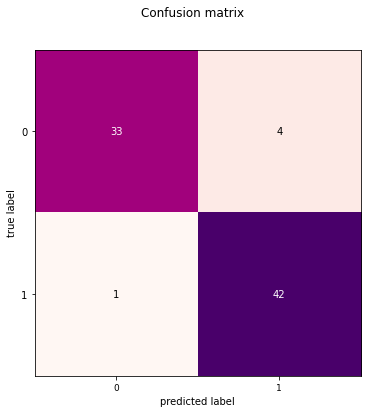

In [49]:
# Instance of the model, train and check results
rf_os = preprocessing.RandomForestClassifier(n_estimators = 10000, random_state=42)
rf_os.fit(X_scaled_os_train, y_upsampled_train)
preprocessing.statistics(rf_os,X_scaled_os_test, y_upsampled_test)

In [50]:
# Get predictions
preprocessing.top_2023(rf_os, scaled_23)

Model predicts 3 countries will make it in the top five


,country,0
10,Sweden,1
13,Netherlands,1
16,Armenia,1


#### Neural Network

In [51]:
# Instance of the model
model_nn_os = preprocessing.tf.keras.Sequential([
    preprocessing.tf.keras.layers.Dense(32,  
        input_shape=(X_scaled_os_train.shape[1],)),
    preprocessing.tf.keras.layers.Dense(32, 
        activation='relu', kernel_regularizer=preprocessing.regularizers.l2(0.001)),
    preprocessing.tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model_nn_os.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
model_nn_os.fit(X_scaled_os_train, y_upsampled_train, 
          validation_data = (X_scaled_os_test, y_upsampled_test),
          epochs=55, batch_size=64)

Epoch 1/55
7/7 [==============================] - 2s 64ms/step - loss: 0.7476 - accuracy: 0.5647 - val_loss: 0.7334 - val_accuracy: 0.5250
Epoch 2/55
7/7 [==============================] - 0s 5ms/step - loss: 0.7102 - accuracy: 0.5737 - val_loss: 0.7005 - val_accuracy: 0.5875
Epoch 3/55
7/7 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.6228 - val_loss: 0.6775 - val_accuracy: 0.5875
Epoch 4/55
7/7 [==============================] - 0s 4ms/step - loss: 0.6661 - accuracy: 0.6384 - val_loss: 0.6646 - val_accuracy: 0.5875
Epoch 5/55
7/7 [==============================] - 0s 4ms/step - loss: 0.6513 - accuracy: 0.6384 - val_loss: 0.6551 - val_accuracy: 0.5875
Epoch 6/55
7/7 [==============================] - 0s 5ms/step - loss: 0.6389 - accuracy: 0.6451 - val_loss: 0.6471 - val_accuracy: 0.6250
Epoch 7/55
7/7 [==============================] - 0s 5ms/step - loss: 0.6289 - accuracy: 0.6607 - val_loss: 0.6428 - val_accuracy: 0.6250
Epoch 8/55
7/7 [=================

3/3 [==============================] - 0s 1ms/step


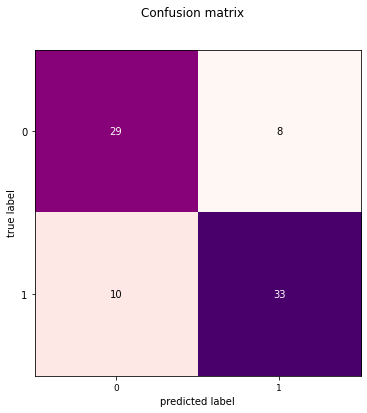

Accuracy: 0.775000
Precision: 0.804878
Recall: 0.767442
F1 score: 0.785714


In [52]:
# Check results
preprocessing.nn_statistics(model_nn_os, X_scaled_os_test, y_upsampled_test)

In [53]:
# Get predictions
pred_2023_nn_os = model_nn_os.predict(scaled_23).flatten()
top_nn_os = pd.concat([paises, pd.DataFrame(pred_2023_nn_os)], axis=1)
top_nn_os.sort_values(by=[0], ascending = False).head(5)

2/2 [==============================] - 0s 2ms/step


,country,0
10,Sweden,0.999791
5,Ireland,0.820337
13,Netherlands,0.734053
30,Australia,0.675551
35,Ukraine,0.617132


# Conclusions 

## Data augmentation
<p style="text-align: justify;">
Based on our analysis, it appears that random oversampling performed better than SMOTE for our Eurovision song contest prediction task. We achieved higher accuracy, precision, recall, and F1 scores with random oversampling for all three models: logistic regression, random forest, and neural network.
</p>
<p style="text-align: justify;">
One possible reason for random oversampling to perform better than SMOTE could be the size of the dataset. With only 327 observations, SMOTE might not have generated enough synthetic samples to effectively balance the classes, leading to overfitting or underfitting issues. On the other hand, random oversampling duplicates the minority class samples, which increases the size of the dataset and reduces the class imbalance. This could have helped the models to learn better decision boundaries and improve their performance.
</p>

## Model performance

<p style="text-align: justify;">
We found that the random forest model performed the best out of the three models we tested, regardless of the data augmentation technique used.
</p>
<p style="text-align: justify;">
It is known that random forests are a powerful and versatile machine learning algorithm that can handle both categorical and continuous features, and can automatically select the most relevant features for the task at hand. 
</p>

## This year's prediction

<p style="text-align: justify;">
Based on the results provided, it appears that the models were able to predict the countries that will be in the top 5 of this year's contest with varying degrees of accuracy. Malta, Dinamarca, and Belgium all had a high accuracy score of 0.92, which indicates that the model correctly predicted these winners in a large percentage of the cases. However, other models predicted that countries such as Serbia, Armenia, and Italy had a lower accuracy score of 0.65, indicating that the model had a harder time predicting the winners for this year.
</p>
<p style="text-align: justify;">
Looking at the precision, recall, and F1 score, it appears that the model was generally able to predict the top 5 with a high degree of precision and recall. However, the F1 score was relatively low, indicating that the models had difficulty balancing both precision and recall for some countries.
</p>
<p style="text-align: justify;">
It's interesting to note that Sweden appeared multiple times in the results, and had a high F1 score of 0.94 in one of the instances. This suggests that Sweden may be a strong contender for this year's Eurovision contest.
</p>
<p style="text-align: justify;">
Overall, it's important to keep in mind that the accuracy of the models may be influenced by the quality and quantity of the data used to train them, and that these results should be interpreted with caution. Nonetheless, these results can be a useful starting point for further analysis and refinement of the models.
</p>

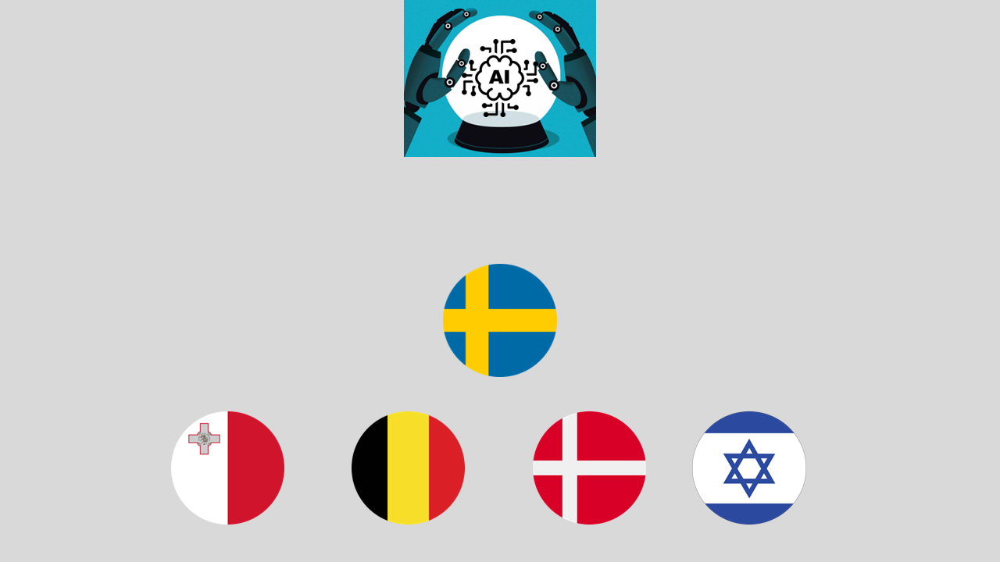

# Bibliography

<h4>Webs</h4>
<p style="text-align: justify;">
<b>Musicstax</b> (2023). “Music Analysis”. Link: <a href="https://musicstax.com/es">https://musicstax.com/es</a>.<br> 
<b>Wikipedia</b> (Online). “Eurovision Song Contest". Link: <a href="https://en.wikipedia.org/wiki/Eurovision_Song_Contest">https://en.wikipedia.org/wiki/Eurovision_Song_Contest</a>.<br>
<b>Kaggle</b> (Online). “Eurovision Song Contest Data”. Link: <a href="https://www.kaggle.com/datasets/diamondsnake/eurovision-song-contest-data">https://www.kaggle.com/datasets/diamondsnake/eurovision-song-contest-data</a>.<br>
<b>HyperPhysics</b> (2001). “Periodic Motion”. Link: <a href="http://hyperphysics.phy-astr.gsu.edu/hbase/Sound/sound.html">http://hyperphysics.phy-astr.gsu.edu/hbase/Sound/sound.html</a>.<br>
<b>UNSW</b> (1997). “Music acoustics”. Link: <a href="https://newt.phys.unsw.edu.au/music/">https://newt.phys.unsw.edu.au/music/</a>.<br>
</p>
<p style="text-align: justify;">
<h4>Datasets<h4> <br>
<b>Kaggle</b> (En Línea). “Eurovision Song Contest”. Link: <a href="https://www.kaggle.com/datasets/evangower/eurovision-song-contest">https://www.kaggle.com/datasets/evangower/eurovision-song-contest</a>
</p>